In [1]:
using DifferentialEquations
using OrdinaryDiffEq
using DiffEqBase
using Sundials
using ODEInterfaceDiffEq
using Plots
using Measures
using CSV
using DataFrames
# using Turing
# using MCMCChains
using EasyFit
using StatsPlots
using LinearAlgebra
using Random
using Distributions
using LsqFit
using BlackBoxOptim
using LaTeXStrings
using JLD2
using BlackBoxOptim: num_func_evals
using LatinHypercubeSampling

# Load Model Functions

In [2]:
include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\InitalParameterFitPriorDef\\ModelFunctionsAll.jl")

ObjectFunctMERP (generic function with 1 method)

# Load Data and Pyruvate T1s

In [3]:
global dat32mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));
global dat128mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_12-8mMPyr_Dat.csv", DataFrame));

global datT1 = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\T1s.csv", DataFrame));

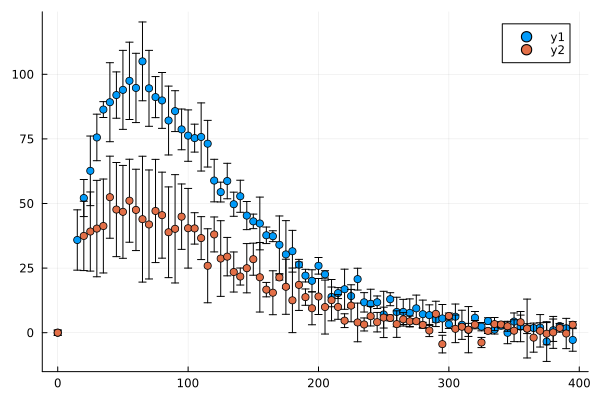

In [4]:
scatter(dat32mM[:,1], dat32mM[:,4], yerror=dat32mM[:,5])
scatter!(dat128mM[:,1], dat128mM[:,4], yerror=dat128mM[:,5])

# Scalling Factor Calculation

In [5]:
P0s = JLD2.load("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\P0s.jld")["P0s"][1:11]

11-element Vector{Float64}:
 6958.136589956337
 7458.120114620354
 8741.632824259454
 6696.892817182159
 7930.229145133655
 6716.359226048676
 5841.831099561959
 7670.508942892556
 7723.389923004057
 6271.245659842545
 6149.3221399365375

In [6]:
global ScF = Normal(mean(P0s./(3200*0.12)), std(P0s./(3200*0.12)))

Normal{Float64}(μ=18.503235909668152, σ=2.289548900260472)

In [7]:
global ScFm = mean(P0s./(3200*0.12))

18.503235909668152

In [9]:
P0s[1]/(ScFm*0.12)

3133.7476247963705

# Test Models

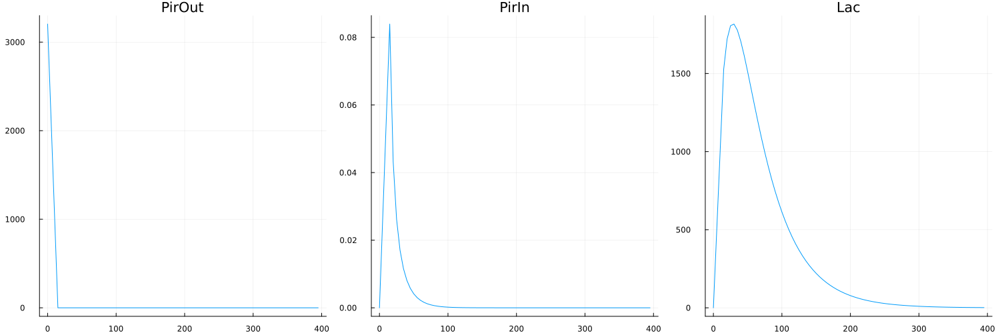

In [12]:
N = 4;

tsC2 = dat32mM[:,1]
ts = 0:tsC2[end];
ivss = [dat32mM[1,2]/(ScFm*0.12),0, dat32mM[1,4]/(ScFm*0.12), 5000/(ScFm*0.12), 0, 0, 0, 0, dat32mM[1,4]/(ScFm*0.12), dat32mM[1,2]/(ScFm*0.12), dat32mM[1,4], dat32mM[1,2]]; # Pout, Php, Xhp, LDH, LDHP1, LDHP2, LDHP3, LDHP4
samps = convert.(Int, tsC2);
pp = [48, 55, 0.044*100000, 0.02, 0.02, 0.001, 0, 0, 0, 0, 0, 0, ScFm] # T1_X, T1_P, kin, kpl, kf, kr, a1, a2, a3, b1, b2, b3
SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllAl(ts, vcat(pp, 0), ivss, samps);

p1 = plot(tsC2, SimOnTime1[:,1,:], label = "", title = "PirOut")
p2 = plot(tsC2, SimOnTime1[:,2,:], label = "", title = "PirIn")
p3 = plot(tsC2, SimOnTime1[:,9,:], label = "", title = "Lac")

plot(p1, p2, p3, size=(1500,500), layout = (1,3))

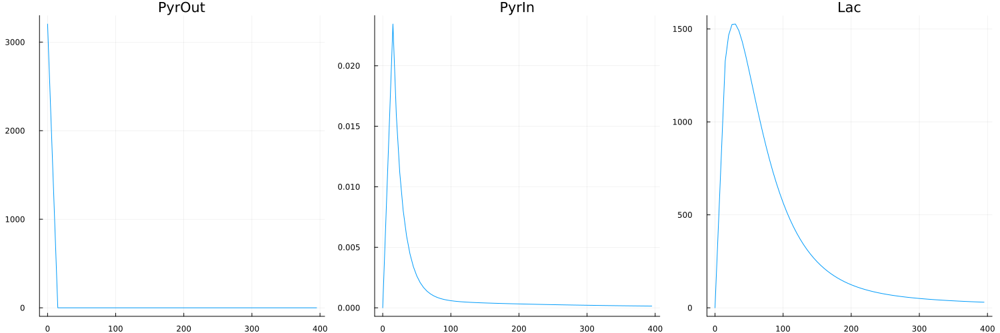

In [13]:
tsC2 = dat32mM[:,1]
ts = 0:tsC2[end];
ivss = [dat32mM[1,2]/(ScFm*0.12),0, dat32mM[1,4]/(ScFm*0.12), 8000/(ScFm*0.12), 0, 0, 0, 0, dat32mM[1,4]/(ScFm*0.12), dat32mM[1,2]/(ScFm*0.12), dat32mM[1,4], dat32mM[1,2]]; # Pout, Php, Xhp, LDH, LDHP1, LDHP2, LDHP3, LDHP4
samps = convert.(Int, tsC2);
pp = [48, 55, 0.0044*1000000000, 0.02, 0.02, 0.001, 0.1, 0.01, 0.001, 0.1, 0.01, 0.001, ScFm] # T1_X, T1_P, kin, kpl, kf, kr, a1, a2, a3, b1, b2, b3
SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllAl(ts, vcat(pp, 0), ivss, samps);

p1 = plot(tsC2, SimOnTime1[:,1,:], label = "", title = "PyrOut")
p2 = plot(tsC2, SimOnTime1[:,2,:], label = "", title = "PyrIn")
p3 = plot(tsC2, SimOnTime1[:,9,:], label = "", title = "Lac")

plot(p1, p2, p3, size=(1500,500), layout = (1,3))

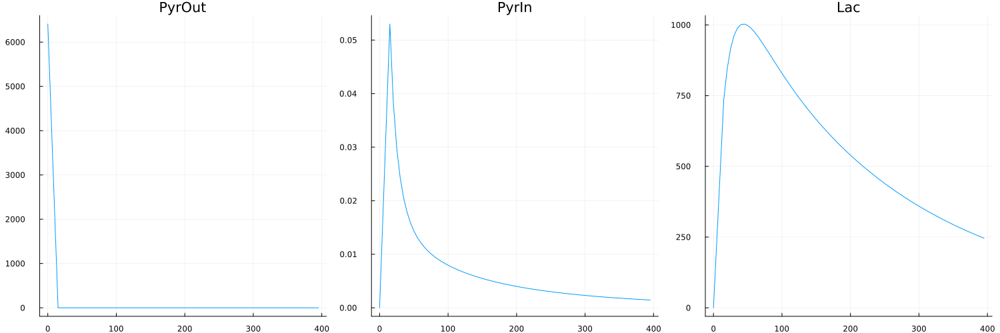

In [14]:
tsC2 = dat32mM[:,1]
ts = 0:tsC2[end];
ivss = [dat32mM[1,2]/(ScFm*0.12)*2,0, dat32mM[1,4]/(ScFm*0.12), 8000/(ScFm*0.12), 0, 0, 0, 0, dat32mM[1,4]/(ScFm*0.12), dat32mM[1,2]/(ScFm*0.12)*2, dat32mM[1,4], dat32mM[1,2]*2]; # Pout, Php, Xhp, LDH, LDHP1, LDHP2, LDHP3, LDHP4
samps = convert.(Int, tsC2);
pp = [48, 55, 0.0044*1000000000, 0.02, 0.02, 0.001, 0.1, 0.01, 0.001, 0.1, 0.01, 0.001, ScFm] # T1_X, T1_P, kin, kpl, kf, kr, a1, a2, a3, b1, b2, b3
SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllAl(ts, vcat(pp, 0), ivss, samps);

p1 = plot(tsC2, SimOnTime1[:,1,:], label = "", title = "PyrOut")
p2 = plot(tsC2, SimOnTime1[:,2,:], label = "", title = "PyrIn")
p3 = plot(tsC2, SimOnTime1[:,9,:], label = "", title = "Lac")

plot(p1, p2, p3, size=(1500,500), layout = (1,3))

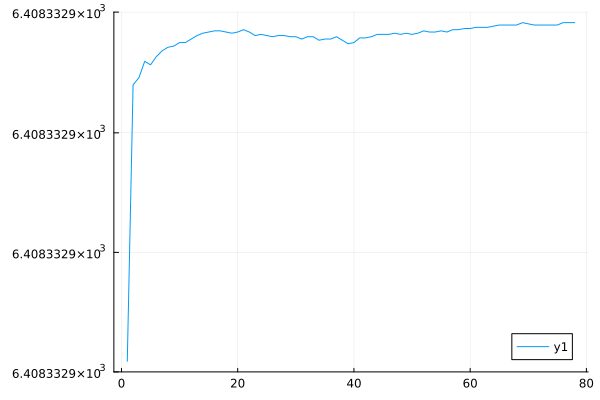

GKS: Possible loss of precision in routine SET_WINDOW


In [15]:
plot(SimOnTime1[:,1,:]+SimOnTime1[:,2,:]+SimOnTime1[:,3,:]+SimOnTime1[:,5,:]+SimOnTime1[:,6,:].*2+SimOnTime1[:,7,:].*3+SimOnTime1[:,8,:].*4)

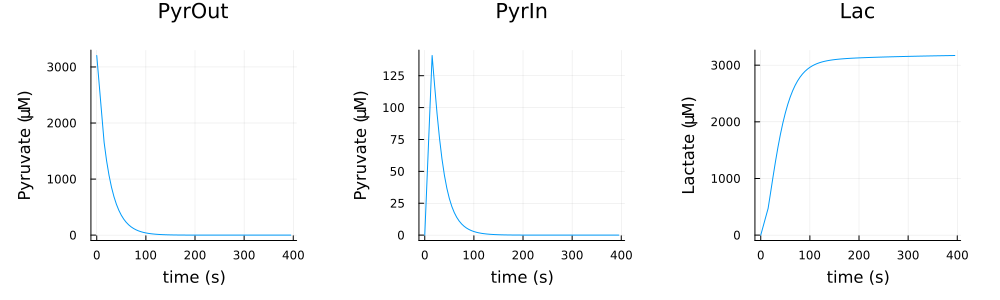

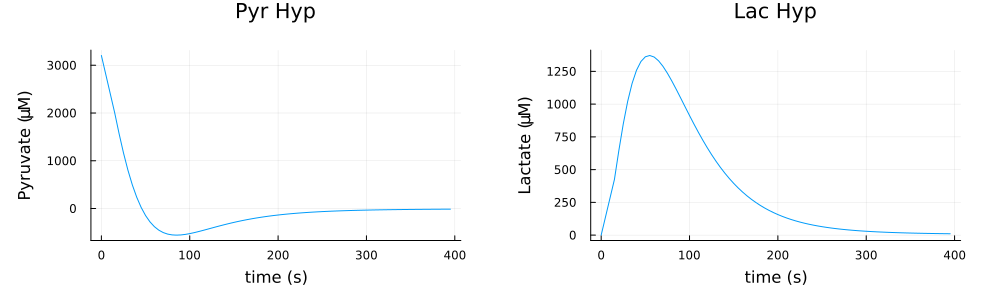

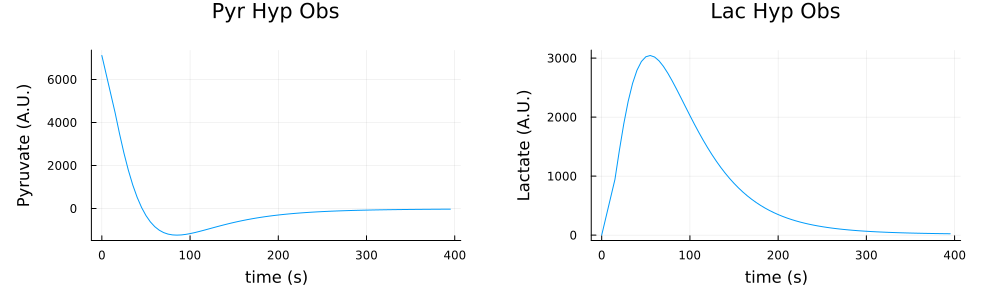

In [16]:
tsC2 = dat32mM[:,1]
ts = 0:tsC2[end];
ivss = [dat32mM[1,2]/(ScFm*0.12), 0, dat32mM[1,4]/(ScFm*0.12), 8000/(ScFm*0.12), 0, 0, 0, 0, dat32mM[1,4]/(ScFm*0.12), dat32mM[1,2]/(ScFm*0.12), dat32mM[1,4], dat32mM[1,2]]; # Pout, Php, Xhp, LDH, LDHP1, LDHP2, LDHP3, LDHP4
samps = convert.(Int, tsC2);
pp = [48, 55, 0.044, 0.02, 0.0002, 0.001, 0.1, 0.01, 0.001, 0.1, 0.01, 0.001, ScFm] # T1_X, T1_P, kin, kpl, kf, kr, a1, a2, a3, b1, b2, b3
SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllAl(ts, vcat(pp, 0), ivss, samps);

p1 = plot(tsC2, SimOnTime1[:,1,:], label = "", title = "PyrOut", xlabel = "time (s)", ylabel = raw"Pyruvate (\muM)")
p2 = plot(tsC2, SimOnTime1[:,2,:], label = "", title = "PyrIn", xlabel = "time (s)", ylabel = raw"Pyruvate (\muM)")
p3 = plot(tsC2, SimOnTime1[:,3,:], label = "", title = "Lac", xlabel = "time (s)", ylabel = raw"Lactate (\muM)")

display(plot(p1, p2, p3, size=(1000,300), layout = (1,3), margin = 8mm))


p1 = plot(tsC2, SimOnTime1[:,10,:], label = "", title = "Pyr Hyp", ylabel = raw"Pyruvate (\muM)", xlabel = "time (s)")
p2 = plot(tsC2, SimOnTime1[:,9,:], label = "", title = "Lac Hyp", ylabel = raw"Lactate (\muM)", xlabel = "time (s)")

display(plot(p1, p2, size=(1000,300), layout = (1,2), margin = 8mm))

p1 = plot(tsC2, SimOnTime1[:,12,:], label = "", title = "Pyr Hyp Obs", ylabel = raw"Pyruvate (A.U.)", xlabel = "time (s)")
p2 = plot(tsC2, SimOnTime1[:,11,:], label = "", title = "Lac Hyp Obs", ylabel = raw"Lactate (A.U.)", xlabel = "time (s)")

plot(p1, p2, size=(1000,300), layout = (1,2), margin = 8mm)

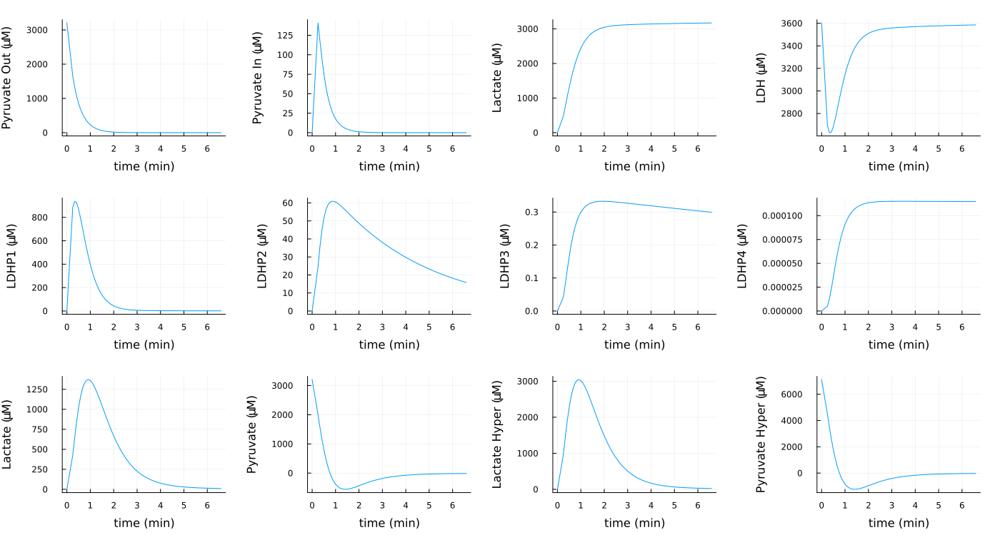

In [17]:
po1 = plot(tsC2./60, SimOnTime1[:,1,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate Out (\muM)")
po2 = plot(tsC2./60, SimOnTime1[:,2,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate In (\muM)")
po3 = plot(tsC2./60, SimOnTime1[:,3,1], label = "", xlabel = "time (min)", ylabel = raw"Lactate (\muM)")
po4 = plot(tsC2./60, SimOnTime1[:,4,1], label = "", xlabel = "time (min)", ylabel = raw"LDH (\muM)")
po5 = plot(tsC2./60, SimOnTime1[:,5,1], label = "", xlabel = "time (min)", ylabel = raw"LDHP1 (\muM)")
po6 = plot(tsC2./60, SimOnTime1[:,6,1], label = "", xlabel = "time (min)", ylabel = raw"LDHP2 (\muM)")
po7 = plot(tsC2./60, SimOnTime1[:,7,1], label = "", xlabel = "time (min)", ylabel = raw"LDHP3 (\muM)")
po8 = plot(tsC2./60, SimOnTime1[:,8,1], label = "", xlabel = "time (min)", ylabel = raw"LDHP4 (\muM)")
po9 = plot(tsC2./60, SimOnTime1[:,9,1], label = "", xlabel = "time (min)", ylabel = raw"Lactate (\muM)")
po10 = plot(tsC2./60, SimOnTime1[:,10,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate (\muM)")
po11 = plot(tsC2./60, SimOnTime1[:,11,1], label = "", xlabel = "time (min)", ylabel = raw"Lactate Hyper (\muM)")
po12 = plot(tsC2./60, SimOnTime1[:,12,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate Hyper (\muM)")

plot(po1, po2, po3, po4, po5, po6, po7, po8, po9, po10, po11, po12, size = (1400,750), margin = 5mm)


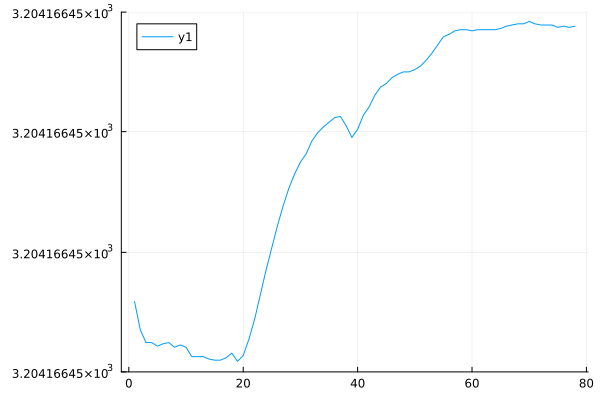

In [18]:
plot(SimOnTime1[:,1,:]+SimOnTime1[:,2,:]+SimOnTime1[:,3,:]+SimOnTime1[:,5,:]+(SimOnTime1[:,6,:]).*2+(SimOnTime1[:,7,:]).*3+(SimOnTime1[:,8,:])*4)

3-element Vector{Any}:
 #undef
 #undef
 #undef

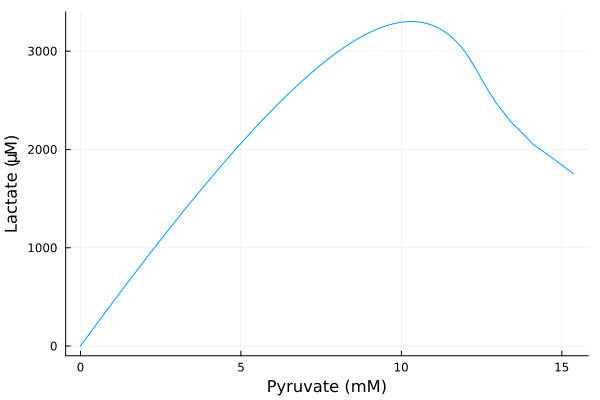

In [19]:
pyrs = collect(0:40:12800*1.2);
lacs = zeros(length(pyrs));

sims = Array{Any}(undef, length(pyrs))

pp = [48, 55, 0.044, 0.02, 0.02, 0.001, 0.1, 0.01, 0.001, 0.1, 0.01, 0.001, ScFm]
cnt = 1;

for i in pyrs

    try
    tsC2 = dat32mM[:,1]
    ts = 0:tsC2[end];
    ivss = [i,0, dat32mM[1,4]/(ScFm*0.12), 8000/(ScFm*0.12), 0, 0, 0, 0, dat32mM[1,4]/(ScFm*0.12), dat32mM[1,2]/(ScFm*0.12), dat32mM[1,4], dat32mM[1,2]];
    samps = convert.(Int, tsC2);
    SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllAl(ts, vcat(vcat(pp), 0), ivss, samps);

    lacs[cnt] = maximum(SimOnTime1[:,9]);
    sims[cnt] = SimOnTime1;
    catch

    end
    cnt += 1;

end

plot(pyrs./1000, lacs, label = "", xlabel = raw"Pyruvate (mM)", ylabel = raw"Lactate (\muM)")


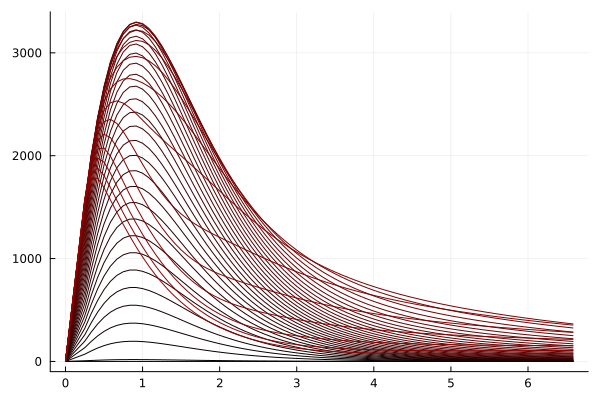

In [529]:
ps = plot(tsC2./60, sims[1][:,9,1], label = "", palette = :gist_heat) # Black low numbers, red middle, and white high
for i in 2:10:length(sims)
    plot!(tsC2./60, sims[i][:,9,1], label = "")
end

display(ps)

In [530]:
# # video repress

# ps = plot(tsC2./60, sims[1][:,9,1], label = "", colour = "Red2", ylim = (0, 3200)) # Black low numbers, red middle, and white high
# # savefig("C:\\IBECPostDocDrive\\2024_03_18_EUROMAR_Conference\\Videos\\Allosteric\\Sim"*string(1)*".png")
# for i in 2:10:length(sims)
#     plot(tsC2./60, sims[i][:,9,1], label = "", colour = "Red2", ylim = (0, 3200))
#     # savefig("C:\\IBECPostDocDrive\\2024_03_18_EUROMAR_Conference\\Videos\\Allosteric\\Sim"*string(i)*".png")

# end

# display(ps)

# Fitting

In [21]:
p = [48, 55, 0.044, 0.02, 0.02, 0.001, 0.1, 0.01, 0.001, 0.1, 0.01, 0.001, 5000/(ScFm*0.12)];

ObjectFunctMEAl(p)

1.224731272564674e6

In [22]:
T1ss = vcat(datT1[1:5,2], datT1[7:11,2]);

In [23]:
Iters = 1;
CCsT = Array{Any}(undef,Iters);
FitsT = Array{Any}(undef,Iters);

In [24]:
Random.seed!(4879564)
plan = randomLHC(Iters,13)
initguessT = scaleLHC(plan,[(48, 48), (55, 55), (0, 1), (1e-50, 1), (1e-50, 1), (0, 1), (0, 1), (0, 0.5), 
(0, 0.1), (0, 1), (0, 0.5), (0, 0.1), (0, 1e8)])

1×13 Matrix{Float64}:
 NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN

7114.49372945483

In [399]:
Threads.nthreads()

20

In [45]:
pp = [48.0
55.0
 0.004827040293108181
 0.03567972754589549
 0.013607634927022862
 0.17934605943088894
 0.0014840913114244827
 0.47985549771664493
 0.9966597264791415
 0.013505186099992749
 0.2939435290492992
 0.03003730811125794
14.781973887275615]

13-element Vector{Float64}:
 48.0
 55.0
  0.004827040293108181
  0.03567972754589549
  0.013607634927022862
  0.17934605943088894
  0.0014840913114244827
  0.47985549771664493
  0.9966597264791415
  0.013505186099992749
  0.2939435290492992
  0.03003730811125794
 14.781973887275615

In [73]:
dat32mM[1,2]

7114.49372945483

In [46]:
i=1
fitness_progress_history = Array{Tuple{Int, Float64},1}()
callback = oc -> push!(fitness_progress_history, (num_func_evals(oc), best_fitness(oc)))

resM = bboptimize(ObjectFunctMEAl, pp; SearchRange = [(48, 48), (55, 55), (0, 1), (1e-50, 1), (1e-50, 1), (0, 1), (0, 1), (0, 1), 
                                                    (0, 1), (0, 1), (0, 1), (0, 1), (0, dat32mM[1,2])], # T1_X, T1_P, kin, kpl, kf, kr, a1, a2, a3, b1, b2, b3
        MaxTime = 60*10, method = :adaptive_de_rand_1_bin, 
        CallbackFunction = callback, CallbackInterval = 0.0)

CCsT[i] = fitness_progress_history;
FitsT[i] = resM;

Starting optimization with optimizer DiffEvoOpt{FitPopulation{Float64}, RadiusLimitedSelector, BlackBoxOptim.AdaptiveDiffEvoRandBin{3}, RandomBound{ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps
0.53 secs, 17 evals, 9 steps, improv/step: 0.444 (last = 0.4444), fitness=8516958.141641874
1.05 secs, 36 evals, 19 steps, improv/step: 0.474 (last = 0.5000), fitness=8516958.141641874
1.62 secs, 55 evals, 29 steps, improv/step: 0.379 (last = 0.2000), fitness=8516958.141641874
2.15 secs, 75 evals, 40 steps, improv/step: 0.375 (last = 0.3636), fitness=8327737.597829844
2.72 secs, 96 evals, 51 steps, improv/step: 0.373 (last = 0.3636), fitness=8327737.597829844
3.25 secs, 119 evals, 68 steps, improv/step: 0.368 (last = 0.3529), fitness=8327737.597829844
3.75 secs, 135 evals, 78 steps, improv/step: 0.385 (last = 0.5000), fitness=8327737.597829844
4.29 secs, 156 evals, 93 steps, improv/step: 0.376 (last = 0.3333), fitness=8327737.597829844
4.89 secs, 173 evals, 105 steps, improv/step: 0.35

In [344]:
# Threads.@threads for i in 1:Iters
#     fitness_progress_history = Array{Tuple{Int, Float64},1}()
#     callback = oc -> push!(fitness_progress_history, (num_func_evals(oc), best_fitness(oc)))

#     resM = bboptimize(ObjectFunctMEAl, initguessT[i,:]; SearchRange = [(48, 48), (55, 55), (0, 1), (1e-50, 1), (1e-50, 1), (0, 1), (0, 1), (0, 0.5), 
#                                                       (0, 0.1), (0, 1), (0, 0.5), (0, 0.1), (0, 1e8)], 
#             MaxTime = 60*1, method = :adaptive_de_rand_1_bin, 
#             CallbackFunction = callback, CallbackInterval = 0.0)

#     CCsT[i] = fitness_progress_history;
#     FitsT[i] = resM;
# end

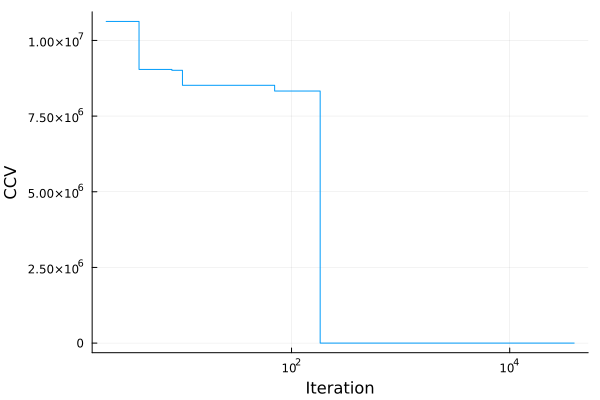

In [47]:
# Plot convergence curve
pl=plot(CCsT[1], xaxis=:log, linetype=:step, label = "", xlabel = "Iteration", ylabel = "CCV")
for i in 2:length(CCsT)
    plot!(CCsT[i], xaxis=:log, linetype=:step, label = "")
end

display(pl)

In [48]:
parfitT = zeros(13, Iters);
for i in 1:Iters
    parfitT[:,i] = best_candidate(FitsT[i]);
end

In [49]:
bestPind = findfirst([CCsT[i][end][2] for i in 1:length(CCsT)] .== minimum([CCsT[i][end][2] for i in 1:length(CCsT)]))

1

In [50]:
ppT = parfitT[:,bestPind]

13-element Vector{Float64}:
 48.0
 55.0
  0.007096300448571609
  0.07470783649626746
  0.03968922475821758
  0.005998426552494106
  0.0003901193647246098
  0.7967520069850212
  0.00019395853661688354
  0.0879742464297741
  0.00026915664232958134
  0.06150611270299029
  7.363810535539445

In [51]:
ObjectFunctMEAl(ppT)

565.3464732087542

In [52]:
ObjectFunctMEAl(vcat(pp, ppT[end]))

1637.513189270995

In [53]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\InitalParameterFitPriorDef\\FitResults\\resMTRRAlo_ScF_New2.jld2", "FitsT",FitsT)
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\InitalParameterFitPriorDef\\FitResults\\resMVectTRRAlo_ScF_New2.jld2", 
        "resMMat",parfitT, "CCsT", CCsT)

In [72]:
ppT = JLD2.load("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\InitalParameterFitPriorDef\\FitResults\\resMVectTRRAlo_ScF_New2.jld2")["resMMat"][:,bestPind]


13-element Vector{Float64}:
 48.0
 55.0
  0.007096300448571609
  0.07470783649626746
  0.03968922475821758
  0.005998426552494106
  0.0003901193647246098
  0.7967520069850212
  0.00019395853661688354
  0.0879742464297741
  0.00026915664232958134
  0.06150611270299029
  7.363810535539445

In [546]:
pp

13-element Vector{Float64}:
 48.0
 55.0
  0.044
  0.02
  0.02
  0.001
  0.1
  0.01
  0.001
  0.1
  0.01
  0.001
 18.503235909668152

## Plot Results

In [54]:
N=4
tsC2 = dat32mM[:,1]
ts = 0:tsC2[end];
ivss = [dat32mM[1,2]/(ScFm*0.12), 0, dat32mM[1,4]/(ScFm*0.12), ppT[end], 0, 0, 0, 0, 0, dat32mM[1,2]/(ScFm*0.12), dat32mM[1,4], dat32mM[1,2]];
samps = convert.(Int, tsC2);
SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllAl(ts, vcat(ppT[1:end-1], ScFm, 0), ivss, samps);


tsC4 = dat128mM[:,1]
ts = 0:tsC4[end];
ivss = [dat128mM[1,2]/(ScFm*0.12), 0, dat128mM[1,4]/(ScFm*0.12), ppT[end], 0, 0, 0, 0, 0, dat128mM[1,2]/(ScFm*0.12), dat128mM[1,4], dat128mM[1,2]];
samps = convert.(Int, tsC4);
SimOnTime2, SimOffTime2, SimAll2  = PyruvateHP_NMR_SolveAllAl(ts, vcat(ppT[1:end-1], ScFm, 0), ivss, samps);



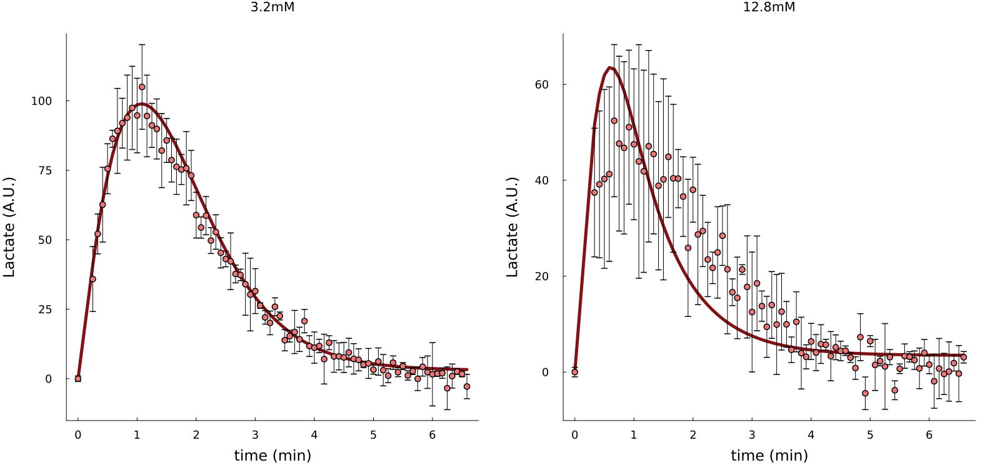

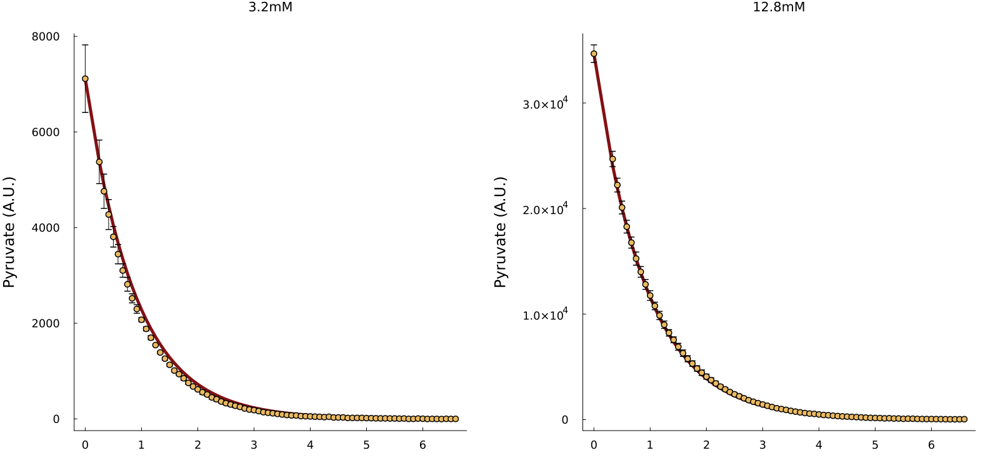

In [55]:
pp1 = plot(tsC2./60, SimOnTime1[:,12,1], linewidth = 5, color = "#821114ff", label = "", title = "2 Mil")
scatter!(tsC2./60, dat32mM[:,2], yerror = dat32mM[:,3], label = "", xlabel="", ylabel = "Pyruvate (A.U.)", grid = false, color="#eaba61ff", markersize=5)

pp2 = plot(tsC2./60, SimOnTime1[:,11,1], linewidth = 5, color = "#821114ff", label = "")
scatter!(tsC2./60, dat32mM[:,4], yerror = dat32mM[:,5], label = "", xlabel="time (min)", ylabel = "Lactate (A.U.)", grid = false, color="#ed7679ff", markersize=5)

P1 = plot(pp2, layout=(2,1), size = (800,750), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12, title = "3.2mM")
P1b = plot(pp1, layout=(2,1), size = (800,750), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12, title = "3.2mM")

pp1 = plot(tsC4./60, SimOnTime2[:,12,1], linewidth = 5, color = "#821114ff", label = "", title = "4 Mil")
scatter!(tsC4./60, dat128mM[:,2], yerror = dat128mM[:,3], label = "", xlabel="", ylabel = "Pyruvate (A.U.)", grid = false, color="#eaba61ff", markersize=5)

pp2 = plot(tsC4./60, SimOnTime2[:,11,1], linewidth = 5, color = "#821114ff", label = "")
scatter!(tsC4./60, dat128mM[:,4], yerror = dat128mM[:,5], label = "", xlabel="time (min)", ylabel = "Lactate (A.U.)", grid = false, color="#ed7679ff", markersize=5)

P2 = plot(pp2, layout=(2,1), size = (800,750), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12, title = "12.8mM")
P2b = plot(pp1, layout=(2,1), size = (800,750), margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12, title = "12.8mM")


pF = plot(P1,P2, layout=(1,2), size = (1600,750))
pFb = plot(P1b,P2b, layout=(1,2), size = (1600,750))


# savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SVGsInit\\PosteriorTestAllostericFit_ScF.svg")


display(pF)
display(pFb)

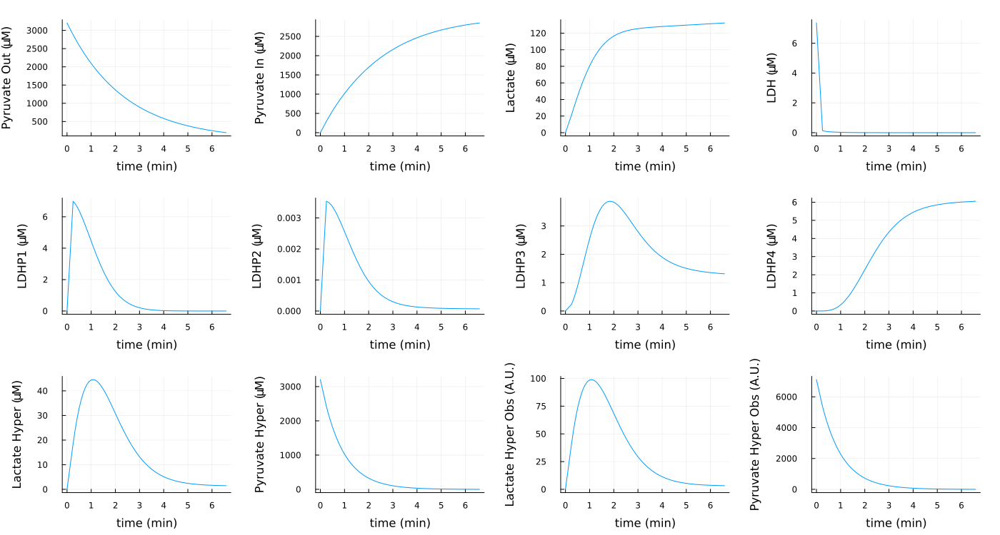

In [56]:

N=4
tsC2 = dat32mM[:,1]
ts = 0:tsC2[end];
ivss = [dat32mM[1,2]/(ScFm*0.12), 0, dat32mM[1,4]/(ScFm*0.12), ppT[end], 0, 0, 0, 0, 0, dat32mM[1,2]/(ScFm*0.12), dat32mM[1,4], dat32mM[1,2]];
samps = convert.(Int, tsC2);
ppT2 = [ppT[1], ppT[2], ppT[3], ppT[4], ppT[5], ppT[6], ppT[7], ppT[8], ppT[9], ppT[10], ppT[11], ppT[12]]
SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllAl(ts, vcat(ppT2, ScFm, 0), ivss, samps);

po1 = plot(tsC2./60, SimOnTime1[:,1,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate Out (\muM)")
po2 = plot(tsC2./60, SimOnTime1[:,2,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate In (\muM)")
po3 = plot(tsC2./60, SimOnTime1[:,3,1], label = "", xlabel = "time (min)", ylabel = raw"Lactate (\muM)")
po4 = plot(tsC2./60, SimOnTime1[:,4,1], label = "", xlabel = "time (min)", ylabel = raw"LDH (\muM)")
po5 = plot(tsC2./60, SimOnTime1[:,5,1], label = "", xlabel = "time (min)", ylabel = raw"LDHP1 (\muM)")
po6 = plot(tsC2./60, SimOnTime1[:,6,1], label = "", xlabel = "time (min)", ylabel = raw"LDHP2 (\muM)")
po7 = plot(tsC2./60, SimOnTime1[:,7,1], label = "", xlabel = "time (min)", ylabel = raw"LDHP3 (\muM)")
po8 = plot(tsC2./60, SimOnTime1[:,8,1], label = "", xlabel = "time (min)", ylabel = raw"LDHP4 (\muM)")
po9 = plot(tsC2./60, SimOnTime1[:,9,1], label = "", xlabel = "time (min)", ylabel = raw"Lactate Hyper (\muM)")
po10 = plot(tsC2./60, SimOnTime1[:,10,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate Hyper (\muM)")
po11 = plot(tsC2./60, SimOnTime1[:,11,1], label = "", xlabel = "time (min)", ylabel = raw"Lactate Hyper Obs (A.U.)")
po12 = plot(tsC2./60, SimOnTime1[:,12,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate Hyper Obs (A.U.)")

plot(po1, po2, po3, po4, po5, po6, po7, po8, po9, po10, po11, po12, size = (1400,750), margin = 5mm)

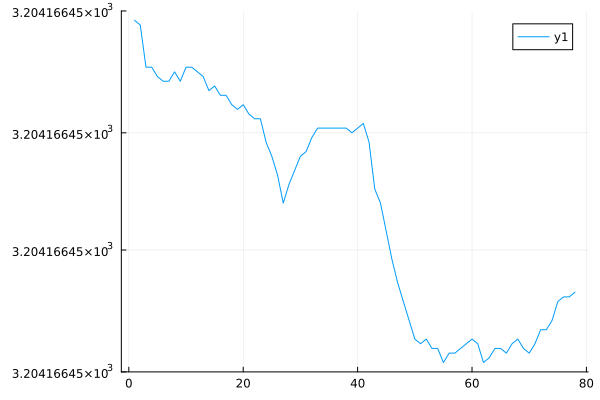

In [57]:
plot(SimOnTime1[:,1,1]+SimOnTime1[:,2,1]+SimOnTime1[:,3,1]+SimOnTime1[:,5,1]+SimOnTime1[:,6,1].*2+SimOnTime1[:,7,1].*3+SimOnTime1[:,8,1]*4)

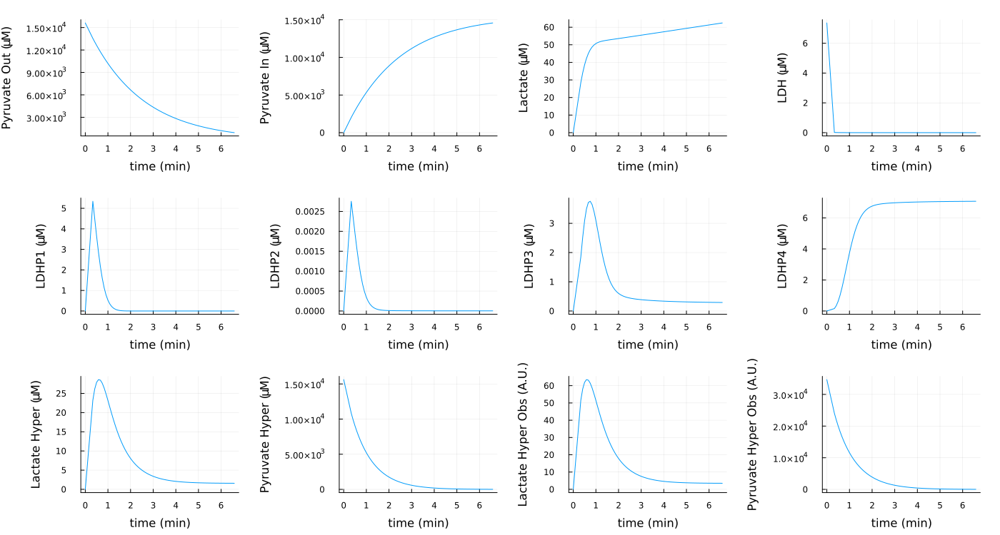

In [58]:
po1 = plot(tsC4./60, SimOnTime2[:,1,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate Out (\muM)")
po2 = plot(tsC4./60, SimOnTime2[:,2,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate In (\muM)")
po3 = plot(tsC4./60, SimOnTime2[:,3,1], label = "", xlabel = "time (min)", ylabel = raw"Lactate (\muM)")
po4 = plot(tsC4./60, SimOnTime2[:,4,1], label = "", xlabel = "time (min)", ylabel = raw"LDH (\muM)")
po5 = plot(tsC4./60, SimOnTime2[:,5,1], label = "", xlabel = "time (min)", ylabel = raw"LDHP1 (\muM)")
po6 = plot(tsC4./60, SimOnTime2[:,6,1], label = "", xlabel = "time (min)", ylabel = raw"LDHP2 (\muM)")
po7 = plot(tsC4./60, SimOnTime2[:,7,1], label = "", xlabel = "time (min)", ylabel = raw"LDHP3 (\muM)")
po8 = plot(tsC4./60, SimOnTime2[:,8,1], label = "", xlabel = "time (min)", ylabel = raw"LDHP4 (\muM)")
po9 = plot(tsC4./60, SimOnTime2[:,9,1], label = "", xlabel = "time (min)", ylabel = raw"Lactate Hyper (\muM)")
po10 = plot(tsC4./60, SimOnTime2[:,10,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate Hyper (\muM)")
po11 = plot(tsC4./60, SimOnTime2[:,11,1], label = "", xlabel = "time (min)", ylabel = raw"Lactate Hyper Obs (A.U.)")
po12 = plot(tsC4./60, SimOnTime2[:,12,1], label = "", xlabel = "time (min)", ylabel = raw"Pyruvate Hyper Obs (A.U.)")

plot(po1, po2, po3, po4, po5, po6, po7, po8, po9, po10, po11, po12, size = (1400,750), margin = 5mm)

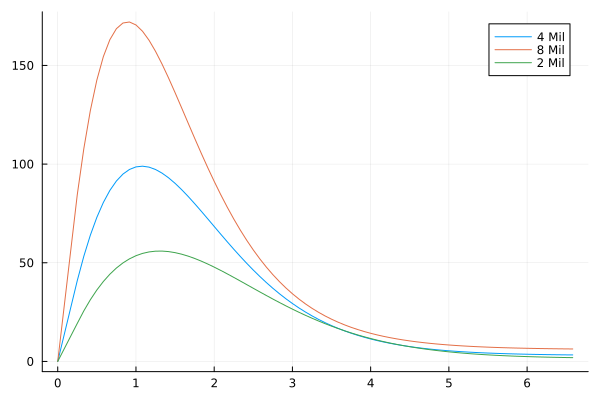

In [71]:
N=4
tsC2 = dat32mM[:,1]
ts = 0:tsC2[end];
ivss1 = [dat32mM[1,2]/(ScFm*0.12), 0, dat32mM[1,4]/(ScFm*0.12), ppT[end], 0, 0, 0, 0, 0, dat32mM[1,2]/(ScFm*0.12), dat32mM[1,4], dat32mM[1,2]];
ivss2 = [dat32mM[1,2]/(ScFm*0.12), 0, dat32mM[1,4]/(ScFm*0.12), ppT[end]*2, 0, 0, 0, 0, 0, dat32mM[1,2]/(ScFm*0.12), dat32mM[1,4], dat32mM[1,2]];
ivss3 = [dat32mM[1,2]/(ScFm*0.12), 0, dat32mM[1,4]/(ScFm*0.12), ppT[end]/2, 0, 0, 0, 0, 0, dat32mM[1,2]/(ScFm*0.12), dat32mM[1,4], dat32mM[1,2]];

samps = convert.(Int, tsC2);
SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllAl(ts, vcat(ppT[1:end-1], ScFm, 0), ivss1, samps);
SimOnTime2, SimOffTime2, SimAll2  = PyruvateHP_NMR_SolveAllAl(ts, vcat(ppT[1:2], ppT[3]*2, ppT[4:end-1], ScFm, 0), ivss2, samps);
SimOnTime3, SimOffTime3, SimAll3  = PyruvateHP_NMR_SolveAllAl(ts, vcat(ppT[1:2], ppT[3]/2, ppT[4:end-1], ScFm, 0), ivss3, samps);


plot(tsC2./60, SimOnTime1[:,11,1], label = "4 Mil")
plot!(tsC2./60, SimOnTime2[:,11,1], label = "8 Mil")
plot!(tsC2./60, SimOnTime3[:,11,1], label = "2 Mil")

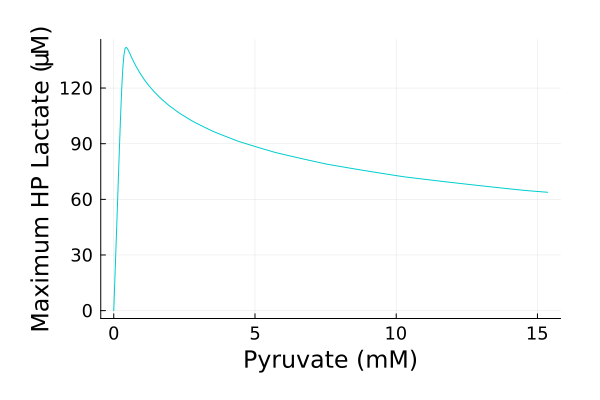

In [68]:
pyrs = collect(0:40:12800*1.2);
lacs = zeros(length(pyrs));

sims = Array{Any}(undef, length(pyrs))


cnt = 1;

for i in pyrs

    try
    tsC2 = dat32mM[:,1]
    ts = 0:tsC2[end];
    ivss = [i,0, dat32mM[1,4], ppT[end], 0, 0, 0, 0, 0, i, 0, i];
    samps = convert.(Int, tsC2);
    SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllAl(ts, vcat(ppT[1:end-1], ScFm, 0), ivss, samps);

    lacs[cnt] = maximum(SimOnTime1[:,11]);
    sims[cnt] = SimOnTime1;
    catch

    end
    cnt += 1;

end

pps = plot(pyrs./1000, lacs, label = "", xlabel = raw"Pyruvate (mM)", ylabel = raw"Maximum HP Lactate (\muM)", color="Cyan3", margin = 8mm, xguidefontsize=16, yguidefontsize=16, tickfontsize=12)

# savefig("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\Paper\\Figures\\SVGsInit\\PyrLacRatAllostericFit_ScF.svg")

display(pps)

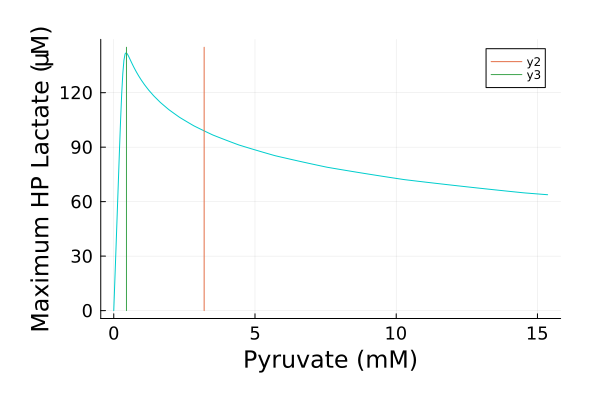

In [69]:
pps
plot!([3.2, 3.2],[0, 145])
plot!([0.45, 0.45],[0, 145])

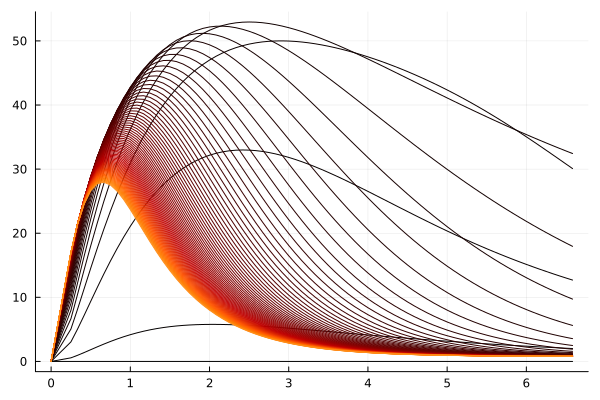

In [41]:
ps = plot(tsC2./60, sims[1][:,9,1], label = "", palette = :gist_heat) # Black low numbers, red middle, and white high
for i in 2:5:length(sims)
    plot!(tsC2./60, sims[i][:,9,1], label = "")
end

display(ps)

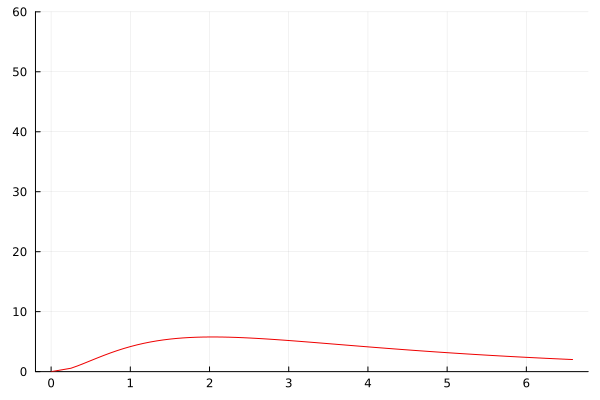

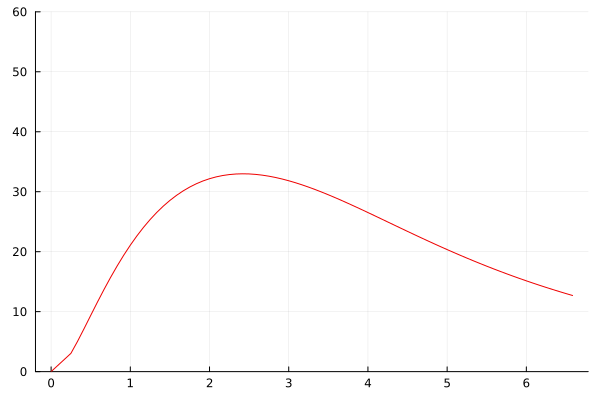

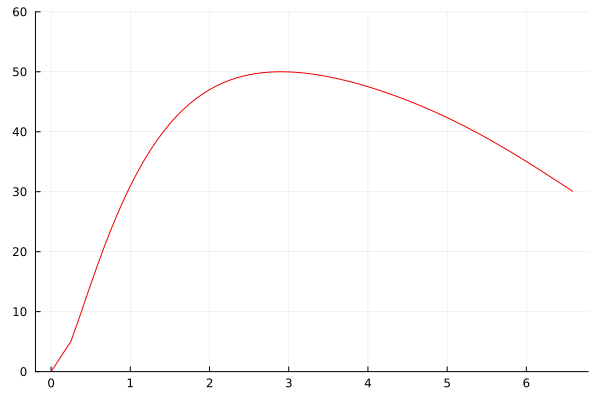

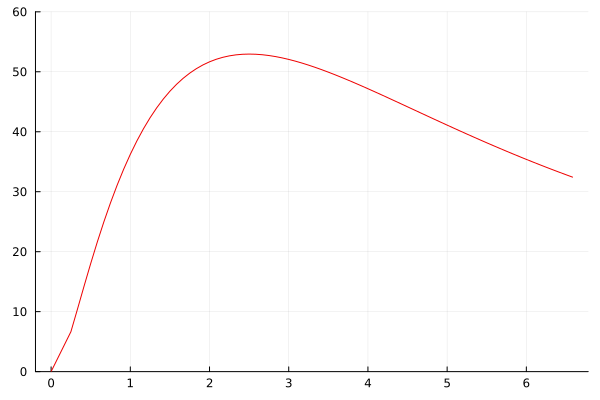

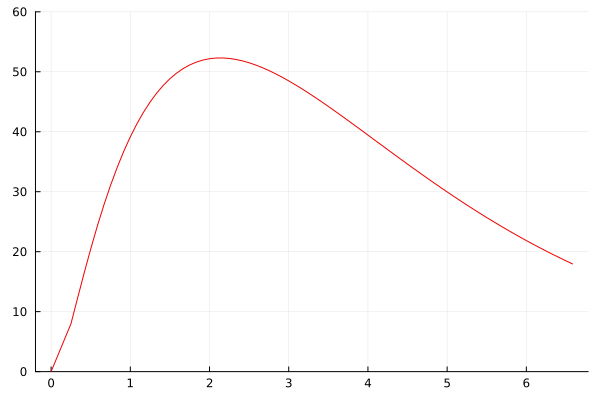

...

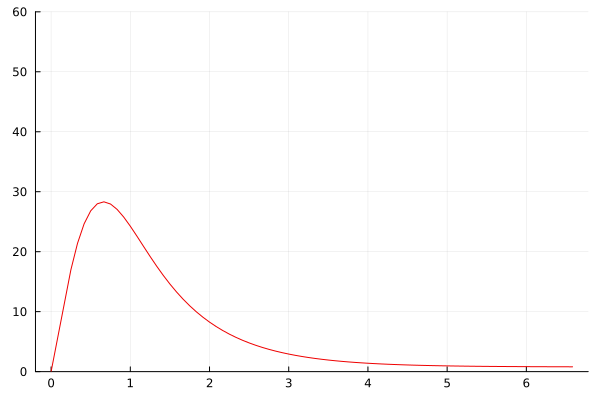

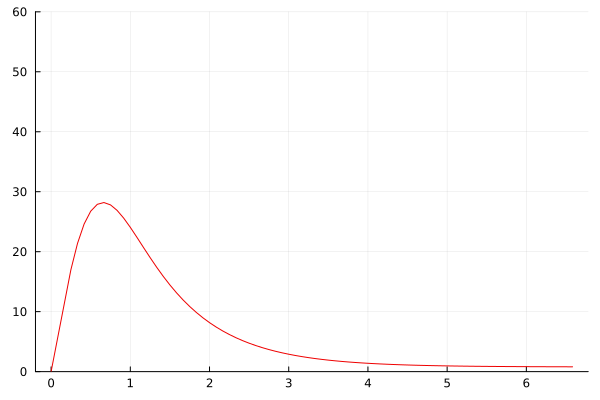

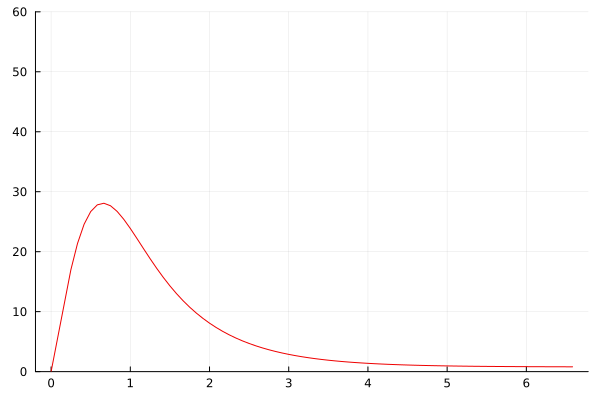

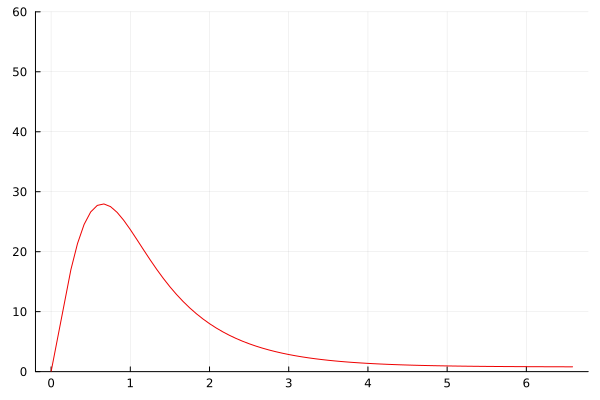

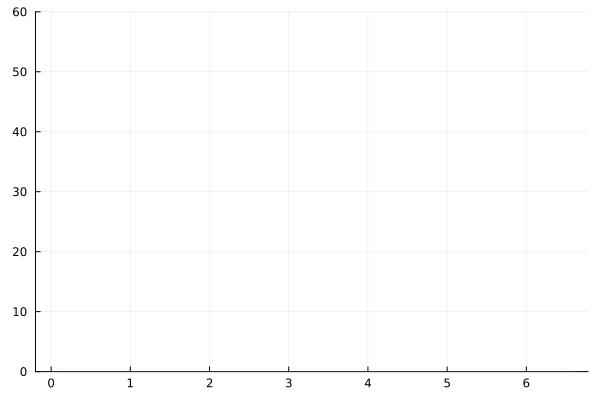

In [43]:
# video repress

ps = plot(tsC2./60, sims[1][:,9,1], label = "", colour = "Red2", ylim = (0, 60)) # Black low numbers, red middle, and white high
# savefig("C:\\IBECPostDocDrive\\2024_03_18_EUROMAR_Conference\\Videos\\AllostericFit\\Sim"*string(1)*".png")
for i in 2:5:length(sims)
    display(plot(tsC2./60, sims[i][:,9,1], label = "", colour = "Red2", ylim = (0, 60)))
    # savefig("C:\\IBECPostDocDrive\\2024_03_18_EUROMAR_Conference\\Videos\\AllostericFit\\Sim"*string(i)*".png")

end

display(ps)